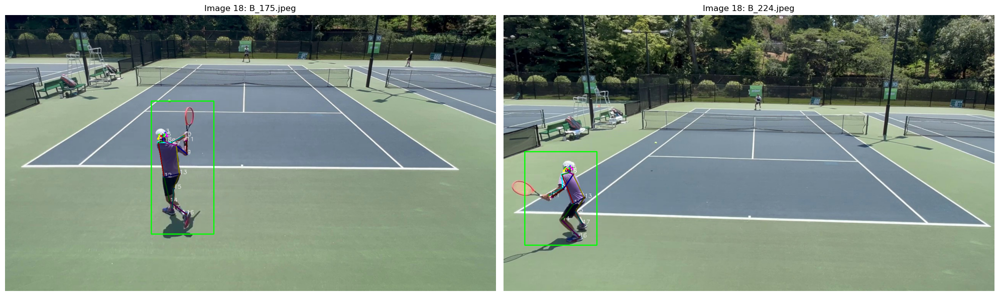

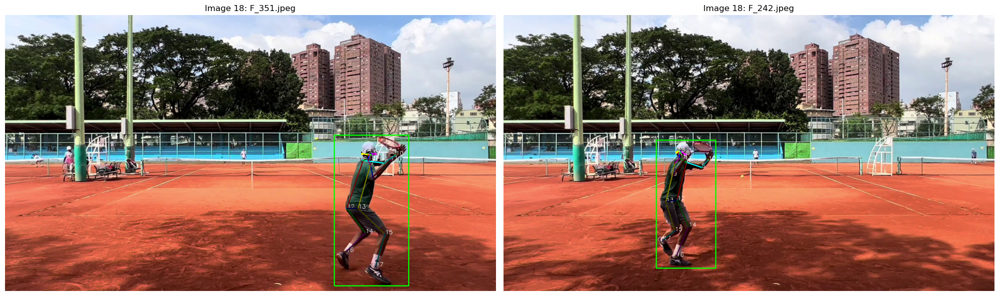

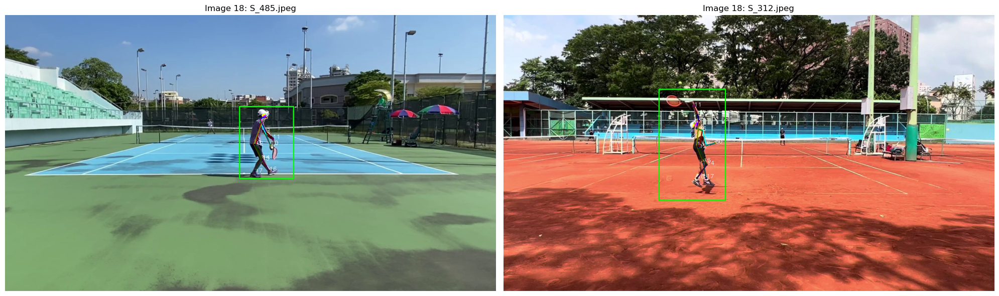

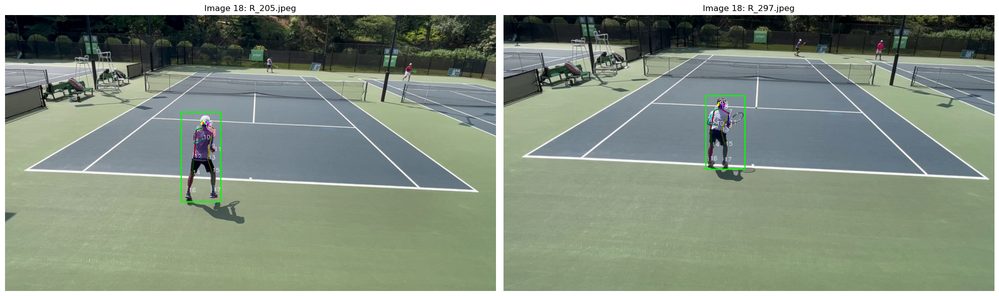

In [28]:
import matplotlib.colors as mcolors
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_and_process_images(json_file, base_path, num_images=2):
    with open(json_file, 'r') as f:
        data = json.load(f)
    
    selected_images = random.sample(data['images'], num_images)
    fig, axes = plt.subplots(1, num_images, figsize=(20, 6))
    
    skeleton = data['categories'][0]['skeleton']
    keypoint_names = data['categories'][0]['keypoints']
    
    for i, (ax, img_info) in enumerate(zip(axes, selected_images)):
        img_path = f"{base_path}/{img_info['path'].lstrip('../')}"
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        img_height, img_width = img.shape[:2]
        
        annotation = next((ann for ann in data['annotations'] if ann['image_id'] == img_info['id']), None)
        if annotation:
            # Convert hex color to RGB
            color = mcolors.to_rgb(annotation['color'])
            color = tuple(int(c * 255) for c in color)  # Convert to 0-255 range
            
            # Scale and draw bounding box
            x, y, w, h = annotation['bbox']
            x = int(x * img_width / img_info['width'])
            y = int(y * img_height / img_info['height'])
            w = int(w * img_width / img_info['width'])
            h = int(h * img_height / img_info['height'])
            cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Changed to green color
            
            # Scale and draw keypoints and skeleton
            keypoints = np.array(annotation['keypoints']).reshape(-1, 3)
            keypoints[:, 0] = keypoints[:, 0] * img_width / img_info['width']
            keypoints[:, 1] = keypoints[:, 1] * img_height / img_info['height']
            
            # Define a list of distinct colors for each joint
            joint_colors = [
                (255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255),
                (0, 255, 255), (128, 0, 0), (0, 128, 0), (0, 0, 128), (128, 128, 0),
                (128, 0, 128), (0, 128, 128), (64, 0, 0), (0, 64, 0), (0, 0, 64),
                (64, 64, 0), (64, 0, 64), (0, 64, 64)
            ]

            for j, (x, y, v) in enumerate(keypoints):
                if v > 0:
                    cv2.circle(img, (int(x), int(y)), 3, joint_colors[j], -1)
                    cv2.putText(img, str(j+1), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
            
            # Draw skeleton
            for i, (start_point, end_point) in enumerate(skeleton):
                if keypoints[start_point-1, 2] > 0 and keypoints[end_point-1, 2] > 0:
                    start = tuple(keypoints[start_point-1, :2].astype(int))
                    end = tuple(keypoints[end_point-1, :2].astype(int))
                    cv2.line(img, start, end, joint_colors[i % len(joint_colors)], 2)
        
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Image {i+1}: {img_info['file_name']}")
    
    plt.tight_layout()
    return fig

# Usage remains the same
json_files = ['backhand.json', 'forehand.json', 'serve.json', 'ready_position.json']
base_path = "dataset"

for json_file in json_files:
    json_file_path = f'dataset/annotations/{json_file}'
    fig = load_and_process_images(json_file_path, base_path)
    plt.show()
    plt.close(fig)  # Close the figure to free up memory

In [29]:
import random
from sklearn.model_selection import train_test_split
import json
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

def prepare_data(json_files, base_path):
    all_data = []
    
    for json_file in json_files:
        json_file_path = f'{base_path}/annotations/{json_file}'
        shot_type = json_file.split('.')[0]
        
        with open(json_file_path, 'r') as f:
            data = json.load(f)
        
        for img_info in data['images']:
            img_path = os.path.join(base_path, img_info['path'].lstrip('../'))
            
            # Find the corresponding annotation
            annotation = next((ann for ann in data['annotations'] if ann['image_id'] == img_info['id']), None)
            
            if annotation:
                # Extract and normalize bounding box
                x, y, w, h = annotation['bbox']
                x_center = (x + w / 2) / img_info['width']
                y_center = (y + h / 2) / img_info['height']
                w = w / img_info['width']
                h = h / img_info['height']
                bbox = [x_center, y_center, w, h]
                
                # Extract and normalize keypoints
                kps = annotation['keypoints']
                normalized_kps = []
                for i in range(0, len(kps), 3):
                    x, y, v = kps[i:i+3]
                    normalized_kps.extend([x / img_info['width'], y / img_info['height'], v])
                
                all_data.append({
                    'image_path': img_path,
                    'bbox': bbox,
                    'keypoints': normalized_kps,
                    'shot_type': shot_type
                })
    
    # Shuffle the data
    random.shuffle(all_data)
    
    # Split the data for each shot type
    train_data, val_data, test_data = [], [], []
    for shot_type in set(item['shot_type'] for item in all_data):
        shot_data = [item for item in all_data if item['shot_type'] == shot_type]
        train, val_test = train_test_split(shot_data, train_size=0.7, random_state=42)
        val, test = train_test_split(val_test, train_size=0.67, test_size=0.33, random_state=42)
        train_data.extend(train)
        val_data.extend(val)
        test_data.extend(test)
    
    # Shuffle again to mix different shot types
    random.shuffle(train_data)
    random.shuffle(val_data)
    random.shuffle(test_data)
    
    return train_data, val_data, test_data

class TennisDataset(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, idx):
        item = self.data[idx]
        image = Image.open(item['image_path']).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        bbox = torch.tensor(item['bbox'], dtype=torch.float32)
        keypoints = torch.tensor(item['keypoints'], dtype=torch.float32)
        label = torch.tensor(['backhand', 'forehand', 'serve', 'ready_position'].index(item['shot_type']), dtype=torch.long)
        
        return image, bbox, keypoints, label

# Prepare the data
json_files = ['backhand.json', 'forehand.json', 'serve.json', 'ready_position.json']
base_path = "dataset"
train_data, val_data, test_data = prepare_data(json_files, base_path)

# Define transforms
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Create datasets
train_dataset = TennisDataset(train_data, transform=transform)
val_dataset = TennisDataset(val_data, transform=transform)
test_dataset = TennisDataset(test_data, transform=transform)

print(f"Train samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Test samples: {len(test_dataset)}")


Train samples: 1400
Validation samples: 400
Test samples: 200


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.5877128].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.1007793..2.64].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.5702832].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.0836544..2.622571].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.535425].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.117904..2.6051416

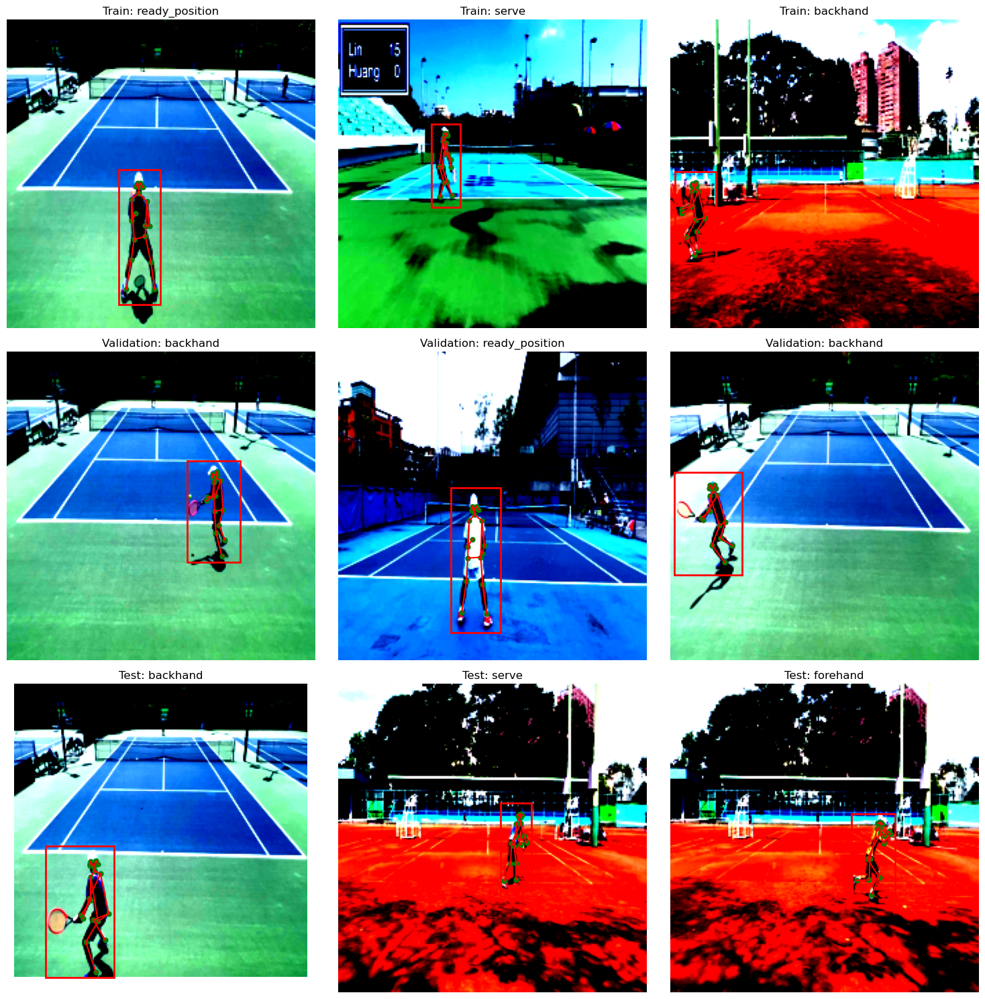

In [30]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def plot_sample(ax, image, bbox, keypoints, label, title):
    ax.imshow(image.permute(1, 2, 0))
    
    # Draw bounding box
    x, y, w, h = bbox
    rect = Rectangle((x*224-w*224/2, y*224-h*224/2), w*224, h*224, linewidth=2, edgecolor='r', facecolor='none')
    ax.add_patch(rect)
    
    # Draw keypoints
    keypoints = keypoints.view(-1, 3)
    for i in range(keypoints.shape[0]):
        x, y, v = keypoints[i]
        if v > 0:
            ax.plot(x*224, y*224, 'go', markersize=5)
    
    # Draw skeleton (you may need to adjust these connections based on your keypoint order)
    connections = [(0, 1), (0, 2), (0, 17), (1, 3), (2, 4), (5, 7), (5, 11), (5, 17), (6, 8), (6, 12), (6, 17), (7, 9), (8, 10), (11, 13), (11, 12), (12, 14), (13, 15), (14, 16)]
    for start, end in connections:
        if keypoints[start, 2] > 0 and keypoints[end, 2] > 0:
            ax.plot([keypoints[start, 0]*224, keypoints[end, 0]*224],
                    [keypoints[start, 1]*224, keypoints[end, 1]*224], 'r-')
    
    ax.set_title(f"{title}: {['backhand', 'forehand', 'serve', 'ready_position'][label]}")
    ax.axis('off')

# Show samples from each dataset
datasets = [('Train', train_dataset), ('Validation', val_dataset), ('Test', test_dataset)]

num_samples = 3
num_datasets = len(datasets)

fig, axs = plt.subplots(num_datasets, num_samples, figsize=(15, 5*num_datasets))

for i, (dataset_name, dataset) in enumerate(datasets):
    for j in range(num_samples):
        image, bbox, keypoints, label = dataset[j]
        plot_sample(axs[i, j], image, bbox, keypoints, label, dataset_name)

plt.tight_layout()
plt.show()


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from tqdm import tqdm
import torch.profiler
import os
import torch
import torch.nn as nn
from torchvision import models
import torch.backends.cudnn as cudnn
from torch.utils.data import DataLoader

# Hyperparameters
NUM_KEYPOINTS = 18
NUM_CLASSES = 4
LEARNING_RATE = 0.001
NUM_EPOCHS = 10
BATCH_SIZE = 32
CHECKPOINT_INTERVAL = 5

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE)

cudnn.benchmark = True

# Define the model
class TennisModel(nn.Module):
    def __init__(self, num_keypoints=NUM_KEYPOINTS, num_classes=NUM_CLASSES):
        super(TennisModel, self).__init__()
        self.backbone = models.resnet50(pretrained=True)
        self.backbone.fc = nn.Identity()  # Remove the last fully connected layer
        
        self.keypoint_head = nn.Sequential(
            nn.Linear(2048, 512),
            nn.ReLU(),
            nn.Linear(512, num_keypoints * 3)  # x, y, visibility coordinates for each keypoint
        )
        
        self.bbox_head = nn.Sequential(
            nn.Linear(2048, 128),
            nn.ReLU(),
            nn.Linear(128, 4)  # x, y, w, h for bounding box
        )
        
        self.classification_head = nn.Sequential(
            nn.Linear(2048, 256),
            nn.ReLU(),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        keypoints = self.keypoint_head(features)
        bbox = self.bbox_head(features)
        classification = self.classification_head(features)
        return keypoints, bbox, classification

# Define the Keypoint and Bounding Box Model
class KeypointBBoxModel(nn.Module):
    def __init__(self, num_keypoints=NUM_KEYPOINTS):
        super(KeypointBBoxModel, self).__init__()
        self.pose_model = models.detection.keypointrcnn_resnet50_fpn(pretrained=True)
        
        # Freeze the backbone and RPN
        for param in self.pose_model.backbone.parameters():
            param.requires_grad = False
        for param in self.pose_model.rpn.parameters():
            param.requires_grad = False
        
        # Modify the keypoint head to output the desired number of keypoints
        self.pose_model.roi_heads.keypoint_predictor = models.detection.keypoint_rcnn.KeypointRCNNPredictor(
            self.pose_model.roi_heads.keypoint_predictor.keypoint_feat_size,
            num_keypoints
        )
        
        # Add a custom bbox head
        self.bbox_head = nn.Sequential(
            nn.Linear(256 * 7 * 7, 1024),
            nn.ReLU(),
            nn.Linear(1024, 4)  # x, y, w, h for bounding box
        )

    def forward(self, x):
        self.pose_model.eval()  # Set to evaluation mode
        with torch.no_grad():
            predictions = self.pose_model(x)
        
        keypoints = predictions[0]['keypoints']
        
        # Extract features for bbox prediction
        features = self.pose_model.backbone(x)
        pooled_features = torch.nn.functional.adaptive_avg_pool2d(features['0'], (7, 7))
        flattened_features = pooled_features.view(pooled_features.size(0), -1)
        bbox = self.bbox_head(flattened_features)
        
        return keypoints, bbox

# Define the Shot Classification Model
class ShotClassificationModel(nn.Module):
    def __init__(self, num_classes=NUM_CLASSES):
        super(ShotClassificationModel, self).__init__()
        self.backbone = models.resnet50(pretrained=True)
        self.backbone.fc = nn.Identity()  # Remove the last fully connected layer
        
        self.classification_head = nn.Sequential(
            nn.Linear(2048, 256),
            nn.ReLU(),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        classification = self.classification_head(features)
        return classification

# Define the Ensemble Model
class TennisEnsembleModel(nn.Module):
    def __init__(self, num_keypoints=NUM_KEYPOINTS, num_classes=NUM_CLASSES):
        super(TennisEnsembleModel, self).__init__()
        self.keypoint_bbox_model = KeypointBBoxModel(num_keypoints)
        self.classification_model = ShotClassificationModel(num_classes)

    def forward(self, x):
        keypoints, bbox = self.keypoint_bbox_model(x)
        classification = self.classification_model(x)
        return keypoints, bbox, classification



In [ ]:
# Set up CUDA
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

model = TennisModel().to(device)
criterion_keypoints = nn.MSELoss()
criterion_bbox = nn.MSELoss()
criterion_classification = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE)

# Initialize the ensemble model
model = TennisEnsembleModel().to(device)

# Move the model to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Define separate optimizers for each sub-model
keypoint_bbox_optimizer = torch.optim.Adam(model.keypoint_bbox_model.parameters(), lr=LEARNING_RATE)
classification_optimizer = torch.optim.Adam(model.classification_model.parameters(), lr=LEARNING_RATE)

# Define loss functions
keypoint_criterion = nn.MSELoss()
bbox_criterion = nn.SmoothL1Loss()
classification_criterion = nn.CrossEntropyLoss()

# Create a directory for checkpoints
os.makedirs('checkpoints', exist_ok=True)

# Training loop
for epoch in tqdm(range(NUM_EPOCHS), desc="Epochs"):
    model.train()
    epoch_loss = 0.0
    
    for batch_idx, (images, bboxes, keypoints, labels) in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}", leave=False)):
        images = images.to(device)
        bboxes = bboxes.to(device)
        keypoints = keypoints.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        
        pred_keypoints, pred_bbox, pred_classification = model(images)
        
        loss_keypoints = criterion_keypoints(pred_keypoints, keypoints)
        loss_bbox = criterion_bbox(pred_bbox, bboxes)
        loss_classification = criterion_classification(pred_classification, labels)
        
        total_loss = loss_keypoints + loss_bbox + loss_classification
        
        total_loss.backward()
        optimizer.step()
        
        epoch_loss += total_loss.item()
        
        if (batch_idx + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{NUM_EPOCHS}], Batch [{batch_idx+1}/{len(train_loader)}], "
                  f"Loss: {total_loss.item():.4f}, Keypoint Loss: {loss_keypoints.item():.4f}, "
                  f"Bbox Loss: {loss_bbox.item():.4f}, Classification Loss: {loss_classification.item():.4f}")
    
    avg_epoch_loss = epoch_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{NUM_EPOCHS}] completed. Average Loss: {avg_epoch_loss:.4f}")
    
    if (epoch + 1) % CHECKPOINT_INTERVAL == 0:
        checkpoint_path = f'checkpoints/model_epoch_{epoch+1}.pth'
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': avg_epoch_loss,
        }, checkpoint_path)
        print(f"Checkpoint saved at {checkpoint_path}")

print("Training completed!")

In [ ]:
# Evaluation
model.eval()
correct = 0
total = 0
val_loss = 0.0

with torch.no_grad():
    for images, bboxes, keypoints, labels in tqdm(val_loader, desc="Validation"):
        images = images.to(device)
        bboxes = bboxes.to(device)
        keypoints = keypoints.to(device)
        labels = labels.to(device)
        
        pred_keypoints, pred_bbox, pred_classification = model(images)
        
        # Calculate validation loss
        loss_keypoints = criterion_keypoints(pred_keypoints, keypoints)  # Use x, y, and visibility for 18 keypoints
        loss_bbox = criterion_bbox(pred_bbox, bboxes)
        loss_classification = criterion_classification(pred_classification, labels)
        total_loss = loss_keypoints + loss_bbox + loss_classification
        val_loss += total_loss.item()
        
        _, predicted = torch.max(pred_classification.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    avg_val_loss = val_loss / len(val_loader)
    accuracy = 100 * correct / total
    print(f"Validation Accuracy: {accuracy:.2f}%")
    print(f"Validation Loss: {avg_val_loss:.4f}")


In [ ]:
# Testing and Inference
import torch
import torch.nn.functional as F
import numpy as np
from PIL import Image, ImageDraw
from torchvision import transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
import random

# Load the saved checkpoint model
checkpoint = torch.load('checkpoints\model_epoch_10.pth', map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])

# Set model to evaluation mode
model.eval()

# Calculate test accuracy and store results for visualization
correct = 0
total = 0
all_images = []
all_labels = []
all_predictions = []
all_bboxes = []
all_keypoints = []

with torch.no_grad():
    for images, bboxes, keypoints, labels in tqdm(test_loader, desc="Testing"):
        images = images.to(device)
        labels = labels.to(device)
        
        pred_keypoints, pred_bbox, pred_classification = model(images)
        
        _, predicted = torch.max(pred_classification.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        all_images.extend(images.cpu())
        all_labels.extend(labels.cpu())
        all_predictions.extend(predicted.cpu())
        all_bboxes.extend(pred_bbox.cpu())
        all_keypoints.extend(pred_keypoints.cpu())

test_accuracy = 100 * correct / total
print(f"Test Accuracy: {test_accuracy:.2f}%")

# Visualize results for 3 random samples
num_samples = 3
fig, axs = plt.subplots(num_samples, 2, figsize=(12, 6*num_samples))
fig.suptitle('Correct vs Predicted Results', fontsize=16)

random_indices = random.sample(range(len(all_images)), num_samples)

for i, idx in enumerate(random_indices):
    image = all_images[idx].to(device)
    true_label = all_labels[idx].to(device)
    pred_label = all_predictions[idx].to(device)
    bbox = all_bboxes[idx].to(device)
    keypoints = all_keypoints[idx].to(device).reshape(-1, 2)
    
    # Denormalize the image
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(device)
    image = image * std + mean
    image = image.clamp(0, 1)  # Ensure values are in [0, 1] range
    image = image.permute(1, 2, 0).cpu().numpy()
    
    # Function to draw bounding box and keypoints
    def draw_bbox_and_keypoints(ax, image, bbox, keypoints):
        ax.imshow(image)
        
        height, width = image.shape[:2]
        
        # Draw bounding box
        x, y, w, h = bbox.cpu().numpy()
        rect = plt.Rectangle((x*width, y*height), w*width, h*height, fill=False, edgecolor='blue', linewidth=2)
        ax.add_patch(rect)
        
        # Draw keypoints
        keypoints_np = keypoints.cpu().numpy()
        ax.scatter(keypoints_np[:, 0]*width, keypoints_np[:, 1]*height, c='red', s=20)
        
        ax.axis('off')
    
    # Display correct label image
    draw_bbox_and_keypoints(axs[i, 0], image, bbox, keypoints)
    axs[i, 0].set_title(f'Correct: {true_label.item()}')
    
    # Display predicted label image
    draw_bbox_and_keypoints(axs[i, 1], image, bbox, keypoints)
    axs[i, 1].set_title(f'Predicted: {pred_label.item()}')

    # Print bbox and keypoints values (in pixel coordinates)
    print(f"Sample {i+1}:")
    height, width = image.shape[:2]
    bbox_np = bbox.cpu().numpy()
    keypoints_np = keypoints.cpu().numpy()
    
    print("Bounding Box:")
    print(f"{'':>10}{'Correct':>15}{'Predicted':>15}")
    print(f"{'x:':<10}{bbox_np[0]*width:15.2f}{bbox_np[0]*width:15.2f}")
    print(f"{'y:':<10}{bbox_np[1]*height:15.2f}{bbox_np[1]*height:15.2f}")
    print(f"{'width:':<10}{bbox_np[2]*width:15.2f}{bbox_np[2]*width:15.2f}")
    print(f"{'height:':<10}{bbox_np[3]*height:15.2f}{bbox_np[3]*height:15.2f}")
    
    print("\nKeypoints:")
    print(f"{'Point':>5}{'Correct X':>15}{'Correct Y':>15}{'Predicted X':>15}{'Predicted Y':>15}")
    for j, (kx, ky) in enumerate(keypoints_np):
        print(f"{j+1:5d}{kx*width:15.2f}{ky*height:15.2f}{kx*width:15.2f}{ky*height:15.2f}")
    print()

plt.tight_layout()
plt.show()

In [33]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from tqdm import tqdm
from PIL import Image
from torchvision import transforms
from models.tennis_model import TennisModel
# Load the saved checkpoint model
model = TennisModel().to(device)

checkpoint = torch.load('checkpoints\\tennis_model_epoch_10.pth')
model.load_state_dict(checkpoint['model_state_dict'])

# Set model to evaluation mode
model.eval()

# Function to preprocess a single image
def preprocess_image(image):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return transform(image).unsqueeze(0).to(device)

# Function to perform inference on a single image
def inference(image):
    preprocessed_image = preprocess_image(image)
    
    with torch.no_grad():
        pred_keypoints, pred_bbox, pred_classification = model(preprocessed_image)
    
    # Convert predictions to numpy arrays
    keypoints = pred_keypoints.squeeze().cpu().numpy()
    bbox = pred_bbox.squeeze().cpu().numpy()
    class_probs = F.softmax(pred_classification, dim=1).squeeze().cpu().numpy()
    predicted_class = np.argmax(class_probs)
    
    return keypoints, bbox, predicted_class, class_probs

def process_video(input_video_path, output_video_path):
    # Open the input video
    cap = cv2.VideoCapture(input_video_path)
    
    # Get video properties
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    # Create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))
    
    # Process each frame
    for _ in tqdm(range(min(100,total_frames)), desc="Processing video"):
        ret, frame = cap.read()
        if not ret:
            break
        
        # Convert frame to PIL Image
        pil_image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        
        # Perform inference
        keypoints, bbox, predicted_class, class_probs = inference(pil_image)
        
        # Draw bounding box
        x, y, w, h = bbox
        cv2.rectangle(frame, (int(x*width), int(y*height)), (int((x+w)*width), int((y+h)*height)), (0, 255, 0), 2)
        
        # Draw keypoints
        for kp in keypoints.reshape(-1, 2):
            cv2.circle(frame, (int(kp[0]*width), int(kp[1]*height)), 3, (255, 0, 0), -1)
        
        # Add class label
        class_name = f"Class {predicted_class}"
        cv2.putText(frame, f"Class: {class_name}", (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        
        # Write the frame
        out.write(frame)
    
    # Release resources
    cap.release()
    out.release()
    cv2.destroyAllWindows()

# Example usage
input_video_path = "test.mp4"
output_video_path = "annotated_video.mp4"
process_video(input_video_path, output_video_path)

print("Video processing complete. Annotated video saved.")

c:\Users\arnav\anaconda3\envs\FAI_Project\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\arnav\anaconda3\envs\FAI_Project\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
C:\Users\arnav\AppData\Local\Temp\ipykernel_37188\4247145792.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.c

Video processing complete. Annotated video saved.
